# Plot things

We will create a `dummy` tracer as a function of location to showcase each plot, just for the sake of the examples herein.

This guide is organized as follows
- horizontal plts
- vertical plots
- Non-geographic plots
-

In this guide we will focus on how-to plot things using AIBECS' built-in recipes for [Plots.jl](https://github.com/JuliaPlots/Plots.jl).
These recipes are implemented using [RecipesBase.jl]https://github.com/JuliaPlots/RecipesBase.jl(), which are explained in [Plots.jl's documentation](https://docs.juliaplots.org/latest/recipes/).

Throughout we will use the OCIM1 grid.

In [1]:
using AIBECS, Plots
grd, _ = OCIM1.load()

Loading OCIM1 ✔
┌ Info: You are about to use OCIM1 model.
│ If you use it for research, please cite:
│ 
│ - DeVries, T., 2014: The oceanic anthropogenic CO2 sink: Storage, air‐sea fluxes, and transports over the industrial era, Global Biogeochem. Cycles, 28, 631–647, doi:10.1002/2013GB004739.
│ - DeVries, T. and F. Primeau, 2011: Dynamically and Observationally Constrained Estimates of Water-Mass Distributions and Ages in the Global Ocean. J. Phys. Oceanogr., 41, 2381–2401, doi:10.1175/JPO-D-10-05011.1
│ 
│ You can find the corresponding BibTeX entries in the CITATION.bib file
│ at the root of the AIBECS.jl package repository.
│ (Look for the "DeVries_Primeau_2011" and "DeVries_2014" keys.)
└ @ AIBECS.OCIM1 /home/travis/build/briochemc/AIBECS.jl/src/OCIM1.jl:54


(, 
  [1     ,      1]  =  0.000197784
  [2     ,      1]  =  1.05541e-8
  [10384 ,      1]  =  -2.09257e-7
  [10442 ,      1]  =  -0.000191611
  [10443 ,      1]  =  4.80961e-9
  [20825 ,      1]  =  -1.83059e-9
  [20883 ,      1]  =  7.967e-9
  [1     ,      2]  =  -5.98052e-8
  [2     ,      2]  =  0.000187532
  ⋮
  [200160, 200159]  =  -2.04829e-8
  [197886, 200160]  =  2.41231e-9
  [199766, 200160]  =  6.70985e-9
  [199777, 200160]  =  -1.26357e-9
  [199778, 200160]  =  -7.22216e-9
  [199779, 200160]  =  7.59325e-9
  [199790, 200160]  =  -7.41023e-9
  [200156, 200160]  =  -3.07748e-8
  [200159, 200160]  =  -2.14741e-8
  [200160, 200160]  =  5.22074e-8)

## Horizontal plots

### Horizontal slice

The most common thing you plot after a simulation of marine tracers is a horizontal slice.
In this case, you just need to provide the tracer (`dummy` here), the grid object `grd`, and the depth at which you want to plot.

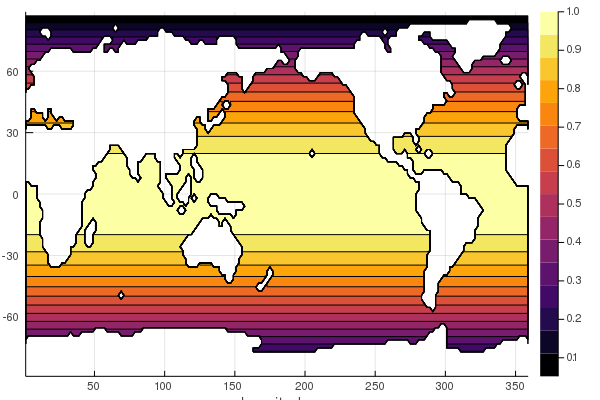

In [2]:
iwet = findall(vec(iswet(grd)))
dummy = cos.(ustrip.(upreferred.(grd.lat_3D[iwet])))
horizontalslice(dummy, grd, 10)

You can supply units for the depth at which you want to see the horizontal slice.

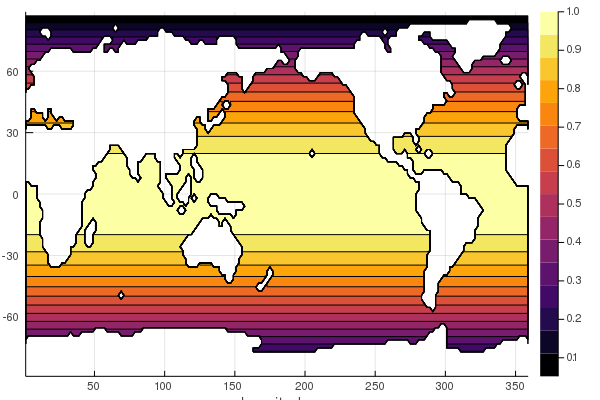

In [3]:
horizontalslice(dummy, grd, 10u"m")

And the units should be understood under the hood.

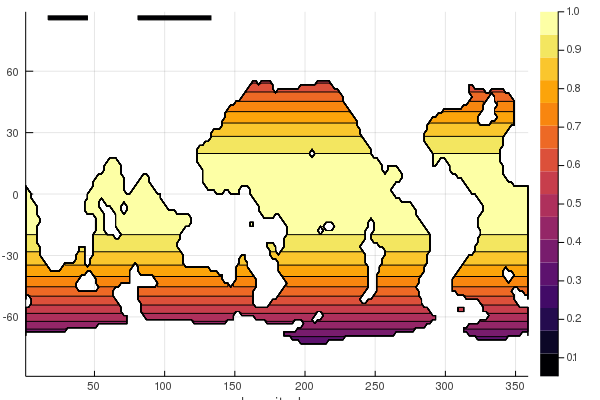

In [4]:
horizontalslice(dummy, grd, 3u"km")

If your tracer is supplied with units, those will show in the colorbar label

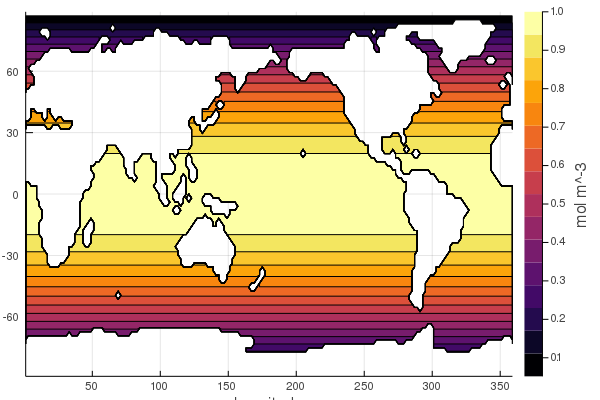

In [5]:
horizontalslice(dummy * u"mol/m^3", grd, 10u"m")

The advantage of Plots.jl recipes like this one is that you can specify other pieces of the plot as you would with built-in functions.
The advantage of Plots.jl recipes like this one is that you can specify other pieces of the plot as you would with built-in functions.
For example, you can chose the colormap

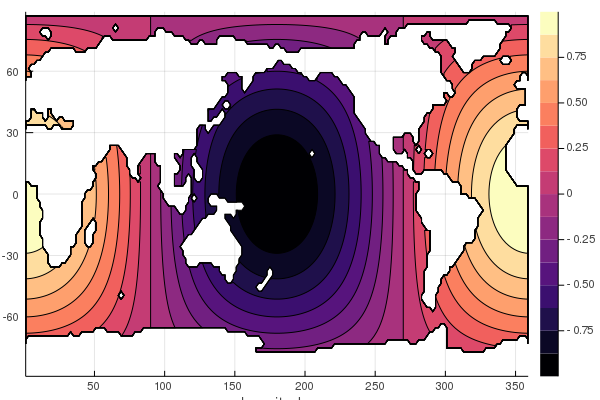

In [6]:
dummy .= cos.(ustrip.(upreferred.(grd.lon_3D[iwet]))) .* dummy
horizontalslice(dummy, grd, 100, color=:magma)

Or you can change predefine bits after the fact.

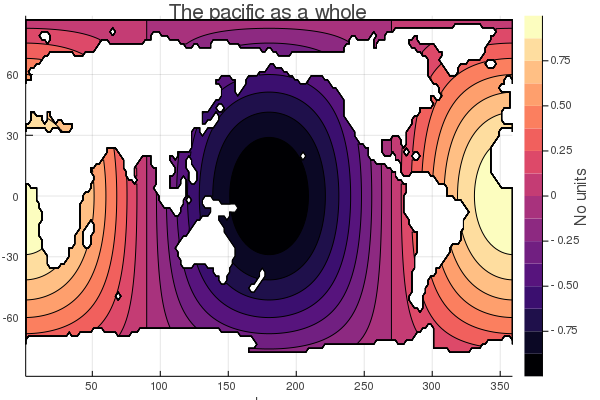

In [7]:
plt = horizontalslice(dummy, grd, 100, color=:magma)
plot!(plt, xlabel="Lon", ylabel="Lat", colorbar_title="No units", title="The pacific as a whole")

## Vertical plots

Exploring the vertical distribution of tracers is important after all.

### Zonal slices

You must specify the longitude

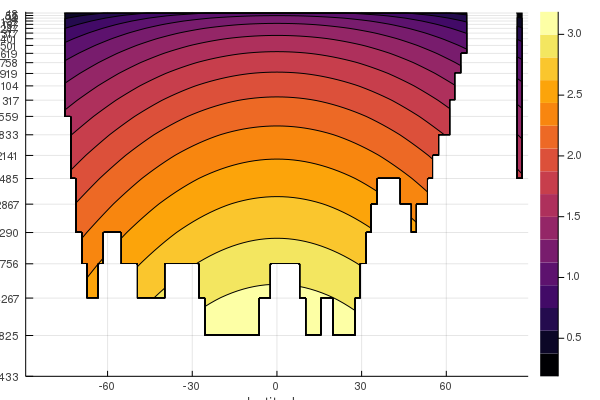

In [8]:
dummy .+= sqrt.(ustrip.(grd.depth_3D[iwet])) / 30
zonalslice(dummy, grd, 330)

### Zonal averages

#### Global zonal average

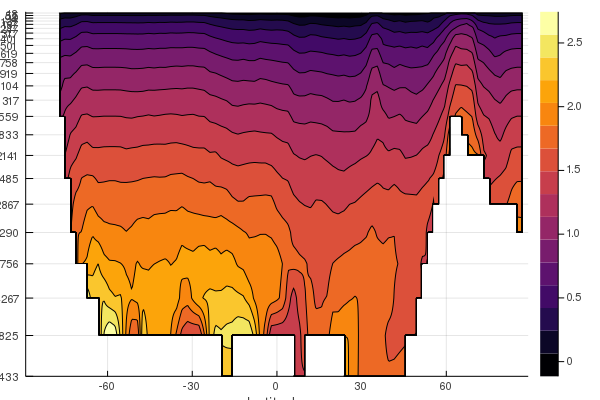

In [9]:
zonalaverage(dummy, grd)

#### Basin zonal average

(not available yet)

### Meridional slices

(not available yet)

### Meridional averages

(not available yet... at all?)

### Zonal transect

(Not available yet...)

### Meridional transect

(Not available yet...)

### Depth profiles

┌ Warning: For performance reasons, consider using an array of a concrete type (eltype(A) == Union{Missing, Float64})
└ @ Interpolations /home/travis/.julia/packages/Interpolations/0zZ6m/src/gridded/gridded.jl:29


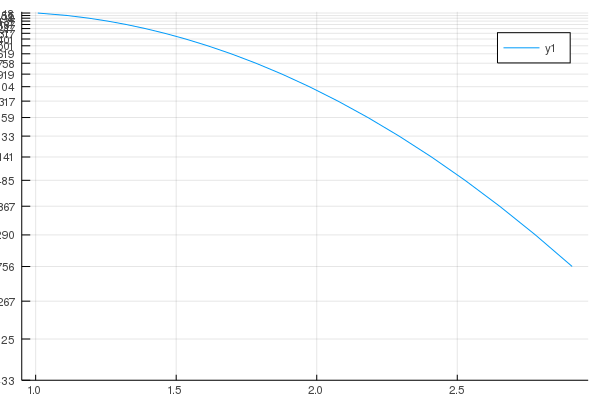

In [10]:
interpolateddepthprofile(dummy, grd, 0, 330)

## Non geographic plots

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*